In [2]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [3]:
#supress user warnings
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Dataset source: https://networkrepository.com/fb-pages-food.php

nodes_path = 'fb-pages-food-nodes.csv'
edges_path = 'fb-pages-food-edges.csv'

nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

G = nx.Graph() # Undirected graph

for _, row in nodes_df.iterrows():
    G.add_node(row['new_id'], label=row['name'])

for _, row in edges_df.iterrows():
    G.add_edge(row['Node 1'], row['Node 2'])

In [5]:
#pos = nx.spectral_layout(G)
#pos = nx.spring_layout(G, scale=10)
#pos = nx.kamada_kawai_layout(G)
#pos = nx.kamada_kawai_layout(G, scale=10)
#pos = nx.fruchterman_reingold_layout(G)

#pos = nx.spring_layout(G, k=2, iterations=200)

pos = nx.fruchterman_reingold_layout(G, k=1.4, iterations=150)


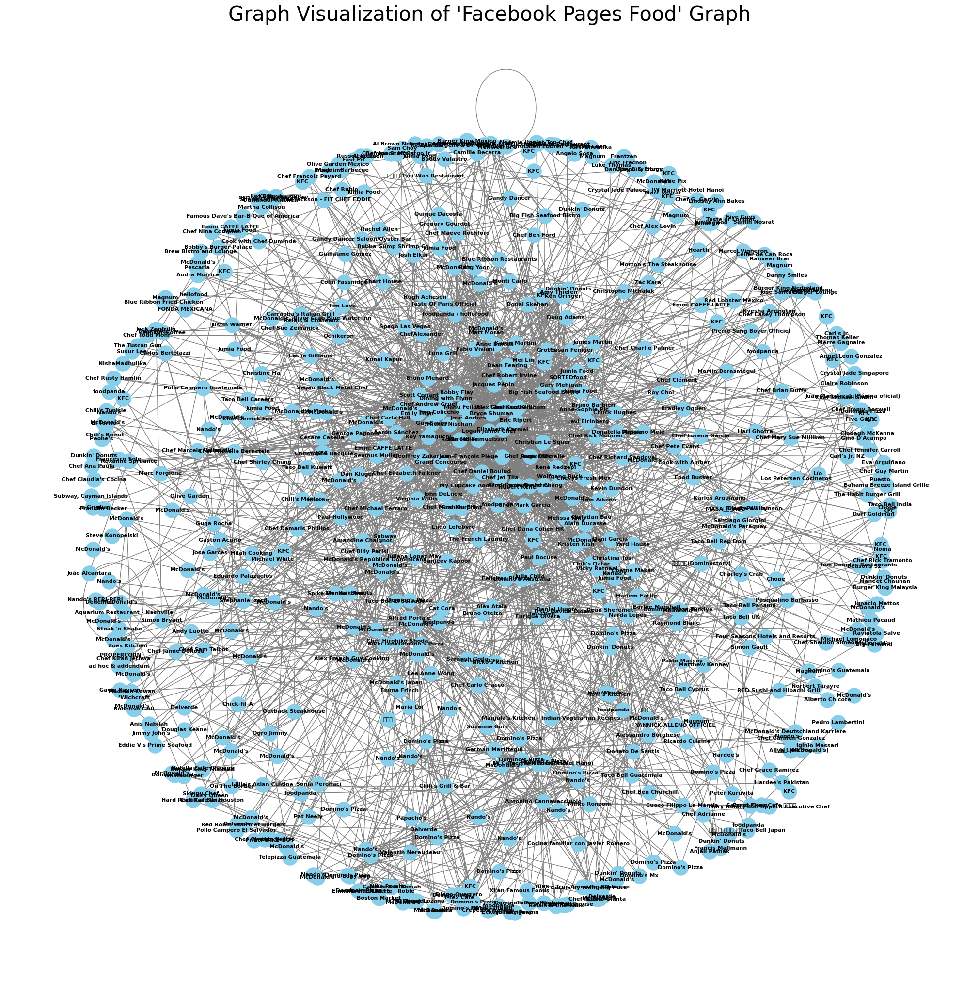

In [6]:
plt.figure(figsize=(20, 20))
nx.draw(G, pos, with_labels=True, labels=nx.get_node_attributes(G, 'label'),
        node_size=500, node_color='skyblue', font_size=8,
        font_color='black', font_weight='bold', edge_color='gray')

plt.title("Graph Visualization of \'Facebook Pages Food\' Graph", size=30)
plt.show()

### Social Network Analysis

Centrality Measures: 
These help identify important nodes in the network.

* Degree Centrality: Measures the number of direct connections a node has.
* Betweenness Centrality: Indicates nodes that act as bridges between different parts of the network.
* Closeness Centrality: Measures how close a node is to all other nodes in the network.
* Eigenvector Centrality: Identifies nodes connected to highly connected nodes.
* Page Rank: PageRank is an algorithm used to rank nodes based on their relative importance or influence within the network.

In [7]:
#Degree Centrality
degree_centrality = nx.degree_centrality(G)

#Betweenness Centrality
betweenness_centrality = nx.betweenness_centrality(G)

#Closeness Centrality
closeness_centrality = nx.closeness_centrality(G)

#Eigenvector Centrality
eigenvector_centrality = nx.eigenvector_centrality_numpy(G)

#PageRank Centrality
pagerank_centrality = nx.pagerank(G)

#Identify most influential nodes by sorting on centrality measures
top_pagerank = sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

In [8]:
#Displaying the top 10 nodes with highest PageRank scores
print("Top 10 nodes by PageRank:")
for new_id, score in top_pagerank:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, PageRank Score: {score}")

#Sorting by Eigenvector Centrality (another way of measuring influence)
top_eigenvector = sorted(eigenvector_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

#Displaying top 10 nodes by Eigenvector Centrality
print("\nTop 10 nodes by Eigenvector Centrality:")
for new_id, score in top_eigenvector:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Eigenvector Centrality: {score}")

#Sorting by Betweenness Centrality (nodes that act as bridges)
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

Top 10 nodes by PageRank:
Node: Logan Junior Chef, PageRank Score: 0.02528736308251475
Node: McDonald's, PageRank Score: 0.014547869032715708
Node: David Chang, PageRank Score: 0.008860842463979817
Node: Eric Ripert, PageRank Score: 0.008394578695731939
Node: Scott Conant, PageRank Score: 0.0076559050019690865
Node: Chef Daniel Boulud, PageRank Score: 0.007613723777791044
Node: Robin Miller, PageRank Score: 0.007566138546930536
Node: Dani García, PageRank Score: 0.007270498839968534
Node: McDonald's, PageRank Score: 0.007234882262368258
Node: Alex Guarnaschelli, PageRank Score: 0.007152129703475651

Top 10 nodes by Eigenvector Centrality:
Node: Logan Junior Chef, Eigenvector Centrality: 0.3257506486968716
Node: Scott Conant, Eigenvector Centrality: 0.22124826194242264
Node: Eric Ripert, Eigenvector Centrality: 0.21990165849718804
Node: David Chang, Eigenvector Centrality: 0.20730903398973966
Node: Alex Guarnaschelli, Eigenvector Centrality: 0.20600800660273244
Node: Robin Miller, Eigen

In [9]:
#Displaying top 10 nodes by Betweenness Centrality
print("\nTop 10 nodes by Betweenness Centrality:")
for new_id, score in top_betweenness:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Betweenness Centrality: {score}")

#Sorting by Closeness Centrality (nodes that can spread information quickly)
top_closeness = sorted(closeness_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

#Displaying top 10 nodes by Closeness Centrality
print("\nTop 10 nodes by Closeness Centrality:")
for new_id, score in top_closeness:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Closeness Centrality: {score}")

#Degree Centrality
top_degree = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]

#Displaying top 10 nodes by Degree Centrality
print("\nTop 10 nodes by Degree Centrality:")
for new_id, score in top_degree:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Degree Centrality: {score}")


Top 10 nodes by Betweenness Centrality:
Node: Logan Junior Chef, Betweenness Centrality: 0.3499076661737781
Node: McDonald's, Betweenness Centrality: 0.16196057068009165
Node: McDonald's, Betweenness Centrality: 0.14456288292404326
Node: Subway, Betweenness Centrality: 0.09327260616363367
Node: Chef Robert Irvine, Betweenness Centrality: 0.09141807568331677
Node: foodpanda - 空腹熊貓, Betweenness Centrality: 0.07911166993681566
Node: Dani García, Betweenness Centrality: 0.07229884637101393
Node: 達美樂披薩, Betweenness Centrality: 0.05838784338316887
Node: Marcus Samuelsson, Betweenness Centrality: 0.05722930269703256
Node: Chef Lorena Garcia, Betweenness Centrality: 0.05702066586628764

Top 10 nodes by Closeness Centrality:
Node: Logan Junior Chef, Closeness Centrality: 0.33137044967880086
Node: Robin Miller, Closeness Centrality: 0.3028375733855186
Node: Chef Daniel Boulud, Closeness Centrality: 0.29816955684007707
Node: Scott Conant, Closeness Centrality: 0.2980259990370727
Node: Alex Guarn

Clustering Coefficient: Measures how interconnected a node's neighbors are. It gives insights into local network structures and the likelihood of forming triangles (cliques).

In [10]:
#Clustering Coefficient
clustering_coefficients = nx.clustering(G)
print("Average clustering coefficient:", nx.average_clustering(G))

top_clustering = sorted(clustering_coefficients.items(), key=lambda x: x[1], reverse=True)[:10]

print("\nTop 10 nodes by Clustering Coefficient:")
for new_id, coeff in top_clustering:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Clustering Coefficient: {coeff}")
print()

Average clustering coefficient: 0.33089702635532725

Top 10 nodes by Clustering Coefficient:
Node: Pat Neely, Clustering Coefficient: 1.0
Node: Charley's Crab, Clustering Coefficient: 1.0
Node: Al Brown New Zealand Chef, Clustering Coefficient: 1.0
Node: Bobby's Burger Palace, Clustering Coefficient: 1.0
Node: McDonald's Deutschland Karriere, Clustering Coefficient: 1.0
Node: Marc Veyrat, Clustering Coefficient: 1.0
Node: Thomas Keller, Clustering Coefficient: 1.0
Node: McDonald's, Clustering Coefficient: 1.0
Node: Acapulco, Clustering Coefficient: 1.0
Node: Delverde, Clustering Coefficient: 1.0



Shortest Paths and Path Lengths: Analyze the shortest paths between nodes to measure network efficiency.

* Average Shortest Path Length: Measures the efficiency of information transfer in the network.
* Diameter: The longest of the shortest paths between any two nodes in the network.

In [11]:
avg_path_length = nx.average_shortest_path_length(G)
diameter = nx.diameter(G)

print(f"Average shortest path length: {avg_path_length}")
print(f"Network diameter: {diameter}")

Average shortest path length: 5.088696649121893
Network diameter: 17


Network Density: Density gives you an idea of how many edges exist in the graph relative to the maximum possible number of edges.

In [12]:
density = nx.density(G)
print(f"Network density: {density}")

Network density: 0.0109541925061233


Assortativity: Measure whether nodes tend to connect to similar nodes (based on degree, attribute, etc.).

* Degree Assortativity: Measures if high-degree nodes tend to connect to other high-degree nodes. The value of degree assortativity ranges from -1 to 1.

In [13]:
assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree assortativity: {assortativity}")

Degree assortativity: -0.028203795222469838


K-Core Decomposition: This is used to identify the core of the network and analyze its robustness. It identifies subgraphs where each node is connected to at least k other nodes in that subgraph.

In [14]:
G_copy = G.copy()
G_copy.remove_edges_from(nx.selfloop_edges(G_copy))
core_number = nx.core_number(G_copy)
print('Core numbers: ', core_number)

Core numbers:  {386: 5, 473: 6, 1: 2, 542: 1, 189: 5, 454: 4, 158: 7, 248: 11, 537: 1, 293: 3, 171: 4, 485: 5, 258: 4, 534: 1, 500: 1, 194: 2, 34: 5, 465: 11, 562: 1, 511: 1, 201: 1, 188: 1, 440: 3, 484: 3, 240: 5, 533: 2, 235: 5, 82: 4, 212: 5, 35: 11, 19: 1, 154: 7, 334: 9, 148: 4, 599: 5, 382: 4, 230: 4, 7: 3, 576: 10, 164: 5, 594: 2, 396: 1, 284: 2, 63: 4, 160: 2, 573: 1, 61: 1, 25: 1, 409: 1, 329: 5, 211: 1, 434: 11, 218: 1, 480: 3, 309: 1, 313: 4, 56: 11, 138: 2, 591: 4, 202: 5, 14: 1, 246: 2, 462: 1, 290: 4, 518: 5, 106: 3, 477: 1, 504: 3, 335: 5, 355: 7, 33: 1, 496: 1, 62: 5, 255: 1, 325: 5, 276: 5, 153: 1, 362: 3, 10: 2, 460: 4, 282: 5, 567: 2, 304: 1, 5: 1, 339: 3, 21: 4, 320: 3, 464: 1, 51: 1, 156: 1, 149: 5, 155: 7, 505: 11, 209: 1, 236: 1, 324: 7, 527: 4, 78: 7, 226: 2, 433: 3, 170: 3, 468: 1, 472: 2, 387: 1, 392: 2, 193: 5, 544: 3, 9: 11, 308: 2, 370: 1, 344: 2, 144: 5, 588: 2, 463: 2, 521: 2, 165: 5, 215: 2, 601: 11, 481: 1, 358: 3, 204: 2, 270: 3, 11: 5, 606: 1, 42: 1, 

Hubs and Authority Scores are concepts that arise from the HITS (Hyperlink-Induced Topic Search) algorithm. This algorithm is primarily used for ranking nodes based on their links to and from other nodes, focusing on two distinct roles in a network: hubs and authorities.

In [15]:
#Hubs & Authorities
hubs, authorities = nx.hits(G)

#Displaying the top 5 hubs
top_hubs = sorted(hubs.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Hub Score:")
for new_id, score in top_hubs:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Hub Score: {score}")

#Displaying the top 5 authorities
top_authorities = sorted(authorities.items(), key=lambda x: x[1], reverse=True)[:5]

print("\nTop 5 nodes by Authority Score:")
for new_id, score in top_authorities:
    node_name = nodes_df[nodes_df['new_id'] == new_id]['name'].values[0]
    print(f"Node: {node_name}, Authority Score: {score}")


Top 5 nodes by Hub Score:
Node: Logan Junior Chef, Hub Score: 0.03119996200803739
Node: Scott Conant, Hub Score: 0.02119086299463196
Node: Eric Ripert, Hub Score: 0.02106188711538419
Node: David Chang, Hub Score: 0.01985578236076412
Node: Alex Guarnaschelli, Hub Score: 0.019731171695494765

Top 5 nodes by Authority Score:
Node: Logan Junior Chef, Authority Score: 0.03119996200803744
Node: Scott Conant, Authority Score: 0.02119086299463196
Node: Eric Ripert, Authority Score: 0.021061887115384176
Node: David Chang, Authority Score: 0.019855782360764105
Node: Alex Guarnaschelli, Authority Score: 0.01973117169549477


In [16]:
#Community Detection
from networkx.algorithms.community import girvan_newman, louvain_communities
from networkx.algorithms.community import greedy_modularity_communities, label_propagation_communities

'''
communities = list(girvan_newman(G))
print('Girvan-Newman method')
print(f"Number of detected communities: {len(communities)}")

print("Top 5 largest communities:")
communities.sort(key=len, reverse=True)
for i, community in enumerate(communities[:5], start=1):
    community_size = len(community)
    print(f"Community {i} size: {community_size}")
print()
'''

communities = greedy_modularity_communities(G)
print('Greedy modularity method')
print(f"Number of detected communities: {len(communities)}")

print("Top 5 largest communities:")
communities.sort(key=len, reverse=True)
for i, community in enumerate(communities[:5], start=1):
    community_size = len(community)
    print(f"Community {i} size: {community_size}")
print()

communities = label_propagation_communities(G)
print('Label propagation method')
print(f"Number of detected communities: {len(communities)}")
communities = [len(x) for x in communities]

print("Top 5 largest communities:")
communities.sort(reverse=True)
for i, community in enumerate(communities[:5], start=1):
    community_size = community
    print(f"Community {i} size: {community_size}")
print()

communities = louvain_communities(G)
print('Louvain method')
print(f"Number of detected communities: {len(communities)}")

print("Top 5 largest communities:")
communities.sort(key=len, reverse=True)
for i, community in enumerate(communities[:5], start=1):
    community_size = len(community)
    print(f"Community {i} size: {community_size}")

Greedy modularity method
Number of detected communities: 22
Top 5 largest communities:
Community 1 size: 164
Community 2 size: 72
Community 3 size: 53
Community 4 size: 46
Community 5 size: 37

Label propagation method
Number of detected communities: 43
Top 5 largest communities:
Community 1 size: 171
Community 2 size: 67
Community 3 size: 54
Community 4 size: 45
Community 5 size: 31

Louvain method
Number of detected communities: 18
Top 5 largest communities:
Community 1 size: 123
Community 2 size: 102
Community 3 size: 71
Community 4 size: 46
Community 5 size: 38


In [17]:
def save_as_csv(data, name):
    df = pd.DataFrame(columns=['Community ' + str(i + 1) for i in range(0, len(data))], index=list(range(0, len(data[0]))))
    for i in range(0, len(data)):
        df.iloc[:, i] = list(data[i]) + [np.nan] * (len(data[0]) - len(data[i]))

    t = pd.read_csv('fb-pages-food-nodes.csv', index_col='new_id')
    t.index = t.index.astype(int)

    for i in range(0, len(data)):
        for j in range(0, len(data[0])):
            if not pd.isna(df.iloc[j, i]):
                df.iloc[j, i] = t.loc[int(df.iloc[j, i]), 'name']
            else:
                df.iloc[j, i] = None
    
    df.to_csv(name + '.csv', index=False, header=False)

communities.sort(key=len, reverse=True)
save_as_csv(communities, 'Louvain')

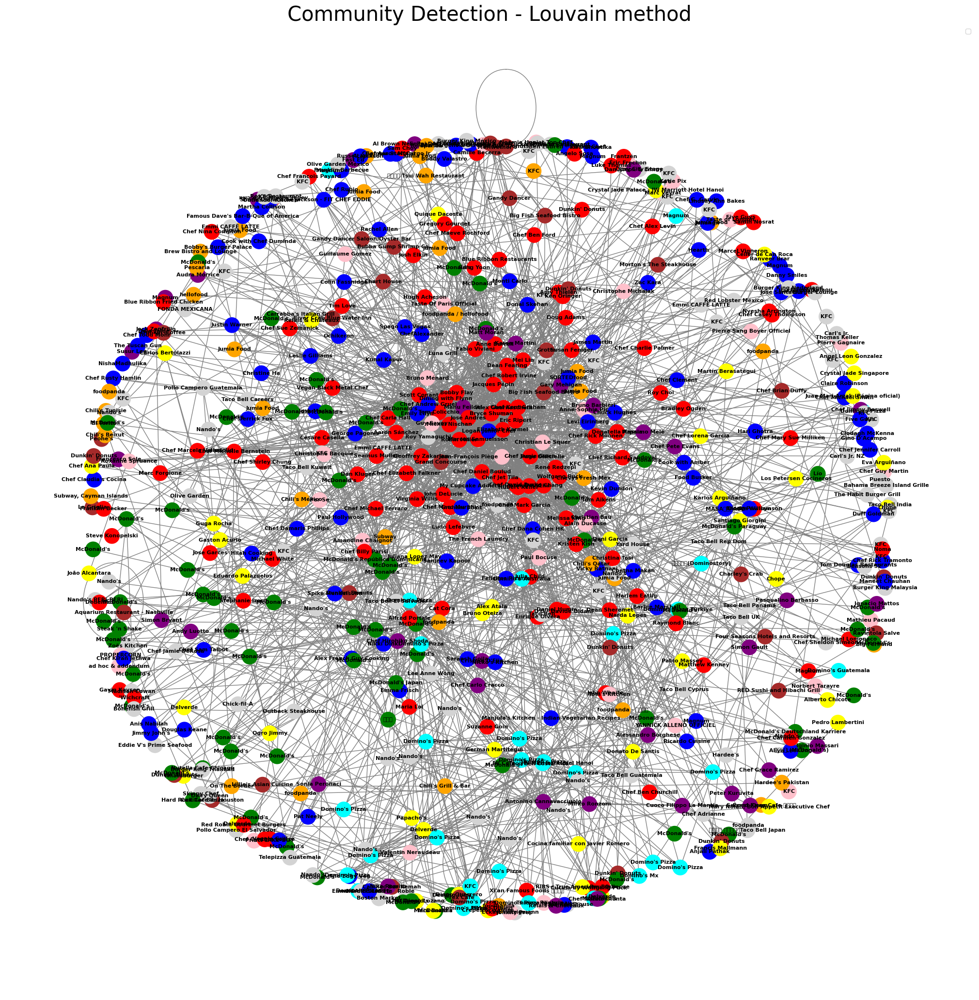

In [18]:
# Visualize communities with different node colors
community_colors = ['red', 'blue', 'green', 'yellow', 'purple', 'orange', 'pink', 'brown', 'cyan', 'lightgray']
node_colors = []
for node in G.nodes():
    for i, community in enumerate(communities):
        if node in community:
            node_colors.append(community_colors[min(i, len(community_colors) - 1)])
            break
    else:
        node_colors.append('lightgray')


plt.figure(figsize=(20, 20))
nx.draw(G, pos, with_labels=True, labels=nx.get_node_attributes(G, 'label'),
        node_size=500, node_color=node_colors, font_size=8,
        font_color='black', font_weight='bold', edge_color='gray')
plt.legend()
plt.title("Community Detection - Louvain method", size=30)
plt.show()

In [19]:
import matplotlib
matplotlib.rc('font', family='DejaVu Sans')

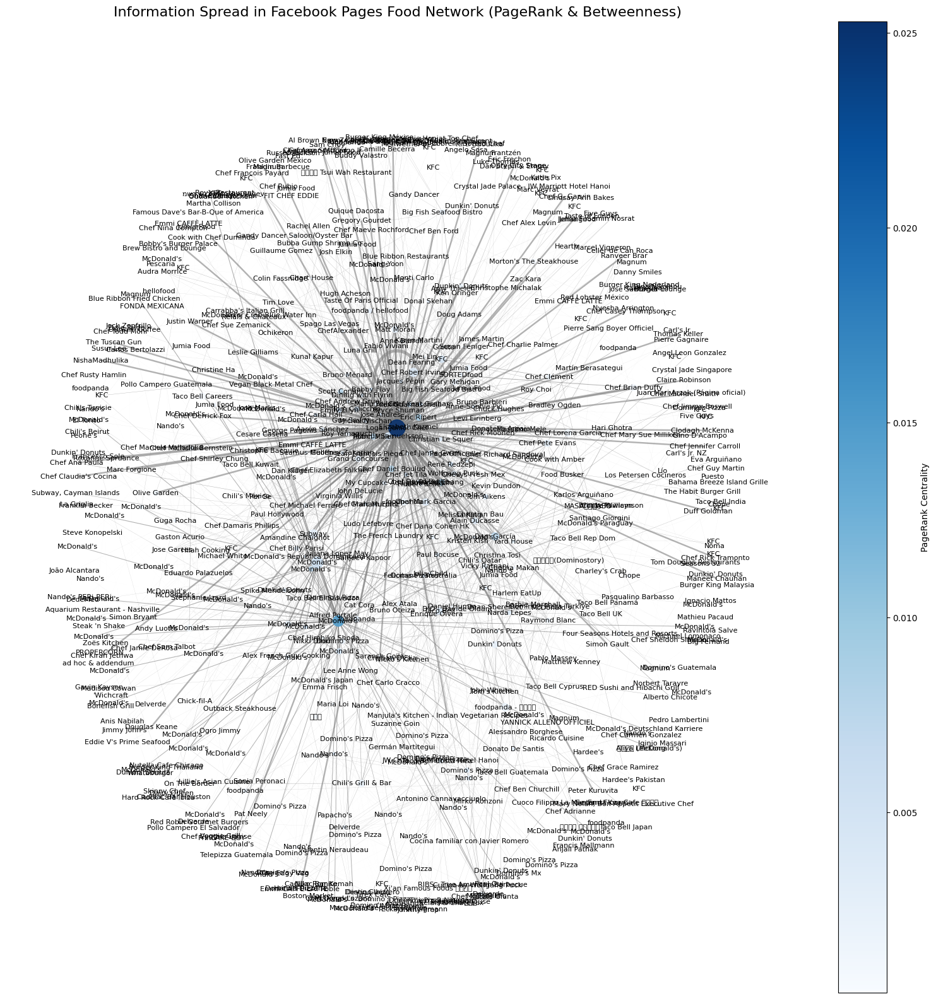

In [20]:
from matplotlib import cm
from matplotlib.colors import Normalize

# Define layout for nodes
#pos = nx.spring_layout(G, seed=42)
#pos = nx.fruchterman_reingold_layout(G, k=1.4, iterations=150)

# Node color based on PageRank centrality
pagerank_values = np.array([pagerank_centrality[node] for node in G.nodes()])
node_color = pagerank_values

#Node size based on Betweenness centrality
betweenness_values = np.array([betweenness_centrality[node] for node in G.nodes()])
node_size = 1000 * betweenness_values

fig, ax = plt.subplots(figsize=(20, 20))

nx.draw_networkx_nodes(G, pos, ax=ax, node_color=node_color, cmap=plt.cm.Blues,
                       node_size=node_size, alpha=0.9)

edges = nx.draw_networkx_edges(G, pos, ax=ax, width=[(betweenness_centrality[edge[0]] + betweenness_centrality[edge[1]]) * 5
                                              for edge in G.edges()], alpha=0.6, edge_color="gray")

nx.draw_networkx_labels(G, pos, labels=nx.get_node_attributes(G, 'label'), font_size=8, ax=ax)

# Add colorbar for PageRank centrality
norm = Normalize(vmin=min(pagerank_values), vmax=max(pagerank_values))
sm = cm.ScalarMappable(cmap=plt.cm.Blues, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('PageRank Centrality')

plt.title("Information Spread in Facebook Pages Food Network (PageRank & Betweenness)", fontsize=16)
plt.axis('off')
plt.show()

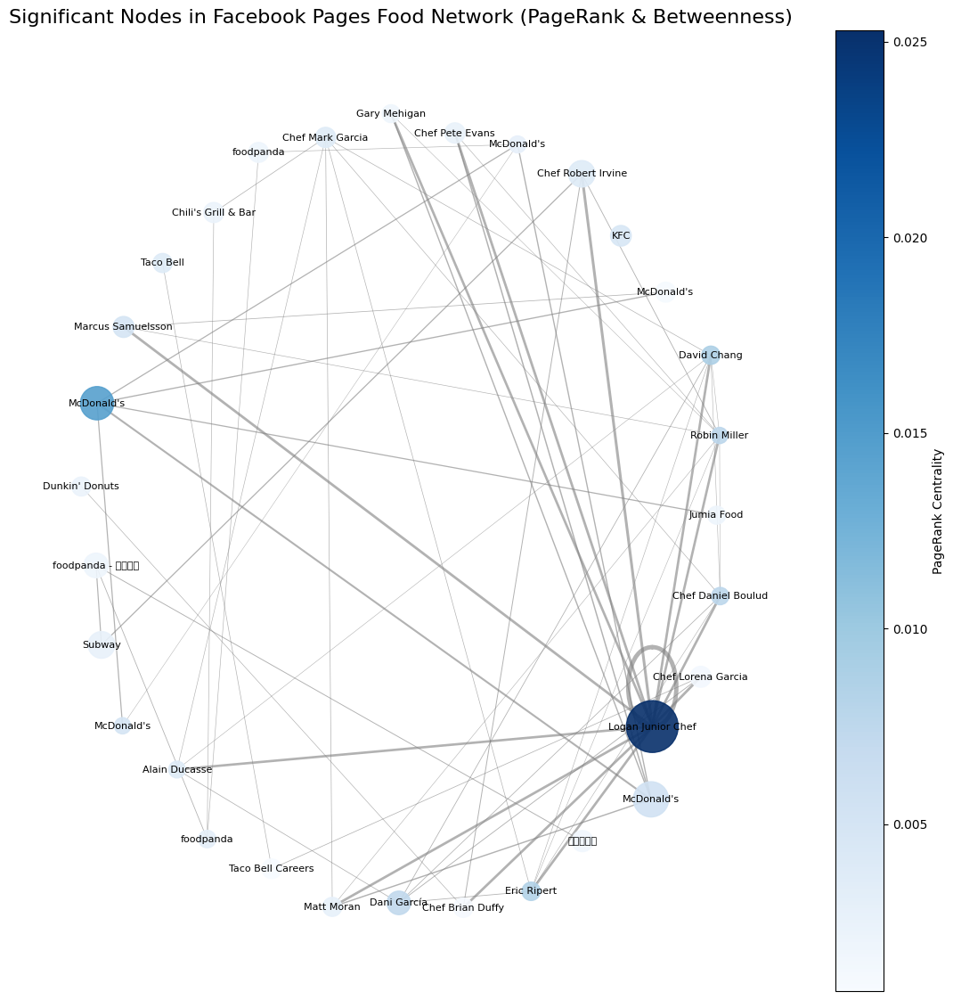

In [21]:
from matplotlib import cm
from matplotlib.colors import Normalize

threshold = np.percentile(list(betweenness_centrality.values()), 95)
#selecting only top 5% significant nodes

significant_nodes = [node for node, value in betweenness_centrality.items() if value > threshold]

subgraph = G.subgraph(significant_nodes)

pagerank_values = np.array([pagerank_centrality[node] for node in subgraph.nodes()])
node_color = pagerank_values

betweenness_values = np.array([betweenness_centrality[node] for node in subgraph.nodes()])
node_size = 5000 * betweenness_values  # Increased scaling factor

fig, ax = plt.subplots(figsize=(14, 14))

t_pos = nx.fruchterman_reingold_layout(subgraph, k=14, iterations=150)

nx.draw_networkx_nodes(subgraph, t_pos, ax=ax, node_color=node_color, cmap=plt.cm.Blues,
                       node_size=node_size, alpha=0.9)

edges = nx.draw_networkx_edges(subgraph, t_pos, ax=ax, width=[(betweenness_centrality[edge[0]] + betweenness_centrality[edge[1]]) * 5
                                              for edge in subgraph.edges()], alpha=0.6, edge_color="gray")

nx.draw_networkx_labels(subgraph, t_pos, labels=nx.get_node_attributes(subgraph, 'label'), font_size=8, ax=ax)

norm = Normalize(vmin=min(pagerank_values), vmax=max(pagerank_values))
sm = cm.ScalarMappable(cmap=plt.cm.Blues, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('PageRank Centrality')

plt.title("Significant Nodes in Facebook Pages Food Network (PageRank & Betweenness)", fontsize=16)
plt.axis('off')
plt.show()

### Information Spread

In [22]:
# Assign activation probabilities
def assign_activation_probabilities():
    prob = np.zeros([G.number_of_nodes(), G.number_of_nodes()])

    for i in G.nodes:
        for j in G.nodes:
            if i != j:
                prob[i, j] = nx.dijkstra_path_length(G, i, j)

    print(prob)
    np.save('prob matrix.npy', prob)

In [23]:
prob = np.load('prob matrix.npy')
prob

array([[0., 3., 3., ..., 3., 3., 2.],
       [3., 0., 2., ..., 3., 3., 5.],
       [3., 2., 0., ..., 3., 3., 5.],
       ...,
       [3., 3., 3., ..., 0., 3., 5.],
       [3., 3., 3., ..., 3., 0., 5.],
       [2., 5., 5., ..., 5., 5., 0.]])

In [24]:
max_val = prob.max()
for i in range(len(prob)):
    for j in range(len(prob[0])):
        prob[i, j] =  1 - prob[i, j] / max_val

print('Probability matrix for Independent Cascade Model\n', prob)

Probability matrix for Independent Cascade Model
 [[1.         0.82352941 0.82352941 ... 0.82352941 0.82352941 0.88235294]
 [0.82352941 1.         0.88235294 ... 0.82352941 0.82352941 0.70588235]
 [0.82352941 0.88235294 1.         ... 0.82352941 0.82352941 0.70588235]
 ...
 [0.82352941 0.82352941 0.82352941 ... 1.         0.82352941 0.70588235]
 [0.82352941 0.82352941 0.82352941 ... 0.82352941 1.         0.70588235]
 [0.88235294 0.70588235 0.70588235 ... 0.70588235 0.70588235 1.        ]]


Iteration:  0  Size of next activated:  6
Iteration:  1  Size of next activated:  50
Iteration:  2  Size of next activated:  179
Iteration:  3  Size of next activated:  126
Iteration:  4  Size of next activated:  126
Iteration:  5  Size of next activated:  56
Iteration:  6  Size of next activated:  43
Iteration:  7  Size of next activated:  17
Iteration:  8  Size of next activated:  2
Iteration:  9  Size of next activated:  1
Iteration:  10  Size of next activated:  1
Iteration:  11  Size of next activated:  1
Iteration:  12  Size of next activated:  0


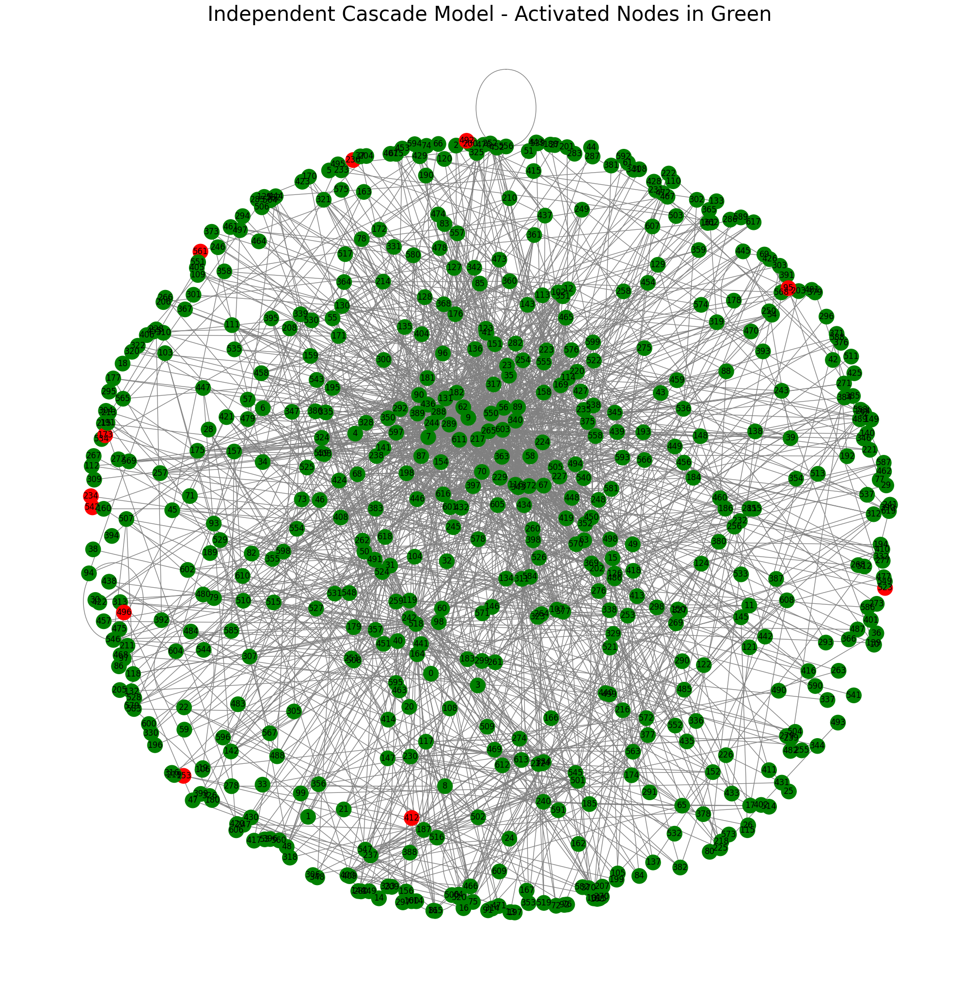

In [25]:
def independent_cascade_model(G, seeds, prob, iterations=100):
    activated = set(seeds)  # Track activated nodes
    new_activated = set(seeds)  # Nodes activated in the current round

    for it in range(iterations):
        next_activated = set()  # Track newly activated nodes in this iteration
        
        for node in new_activated:
            neighbors = list(G.neighbors(node))
            for neighbor in neighbors:
                if neighbor not in activated and np.random.rand() < prob[node, neighbor]:
                    next_activated.add(neighbor)
                    activated.add(neighbor)
        
        print('Iteration: ', it, ' Size of next activated: ', len(next_activated))
        if not next_activated:
            break  # No more nodes can be activated
        
        new_activated = next_activated  # Update for the next round

    return activated

np.fill_diagonal(prob, 0)  # No self-activation

# Set initial seeds
seeds = [0]

# Run the independent cascade model
activated_nodes = independent_cascade_model(G, seeds, prob)

# Visualize the network with activated nodes
plt.figure(figsize=(20, 20))

nx.draw(G, pos, with_labels=True, node_color=['green' if node in activated_nodes else 'red' for node in G.nodes()],
        node_size=500, edge_color='gray')
plt.title("Independent Cascade Model - Activated Nodes in Green", fontsize=30)
plt.show()

In [26]:
thresholds = np.mean(prob, axis=0)
thresholds = (thresholds - min(thresholds)) / 4.5
print('Thresholds for Linear Threshold Model\n', thresholds)

Thresholds for Linear Threshold Model
 [0.104533   0.10799072 0.10849673 0.10328906 0.10811723 0.05502846
 0.09460257 0.10959308 0.10512334 0.11330382 0.09289479 0.07303394
 0.09470799 0.10040059 0.07294961 0.11117436 0.06854312 0.09329538
 0.10796964 0.08102467 0.10290955 0.07391946 0.09295804 0.11121653
 0.06961838 0.08766603 0.05736875 0.08895214 0.05745309 0.08271136
 0.05652541 0.11115328 0.10891841 0.02601729 0.10815939 0.11452667
 0.         0.09816572 0.09392789 0.10501792 0.10107527 0.11507485
 0.07134725 0.11130086 0.10796964 0.09439174 0.10459625 0.08918406
 0.10196078 0.09574109 0.10910816 0.05566097 0.07210626 0.0886148
 0.1086654  0.07459414 0.11610795 0.09833439 0.11267131 0.10839131
 0.10942441 0.09407548 0.1116382  0.10212945 0.09976808 0.09563567
 0.05566097 0.1155176  0.11132195 0.10008433 0.11661396 0.10837023
 0.10744255 0.09215686 0.08597934 0.05585073 0.08313304 0.06088973
 0.07476281 0.09487666 0.0782627  0.09222011 0.10274088 0.10978284
 0.06829011 0.0940544  0

Iteration:  0  Size of next activated:  4
Iteration:  1  Size of next activated:  11
Iteration:  2  Size of next activated:  13
Iteration:  3  Size of next activated:  11
Iteration:  4  Size of next activated:  9
Iteration:  5  Size of next activated:  20
Iteration:  6  Size of next activated:  39
Iteration:  7  Size of next activated:  83
Iteration:  8  Size of next activated:  181
Iteration:  9  Size of next activated:  131
Iteration:  10  Size of next activated:  77
Iteration:  11  Size of next activated:  18
Iteration:  12  Size of next activated:  4
Iteration:  13  Size of next activated:  1
Iteration:  14  Size of next activated:  0


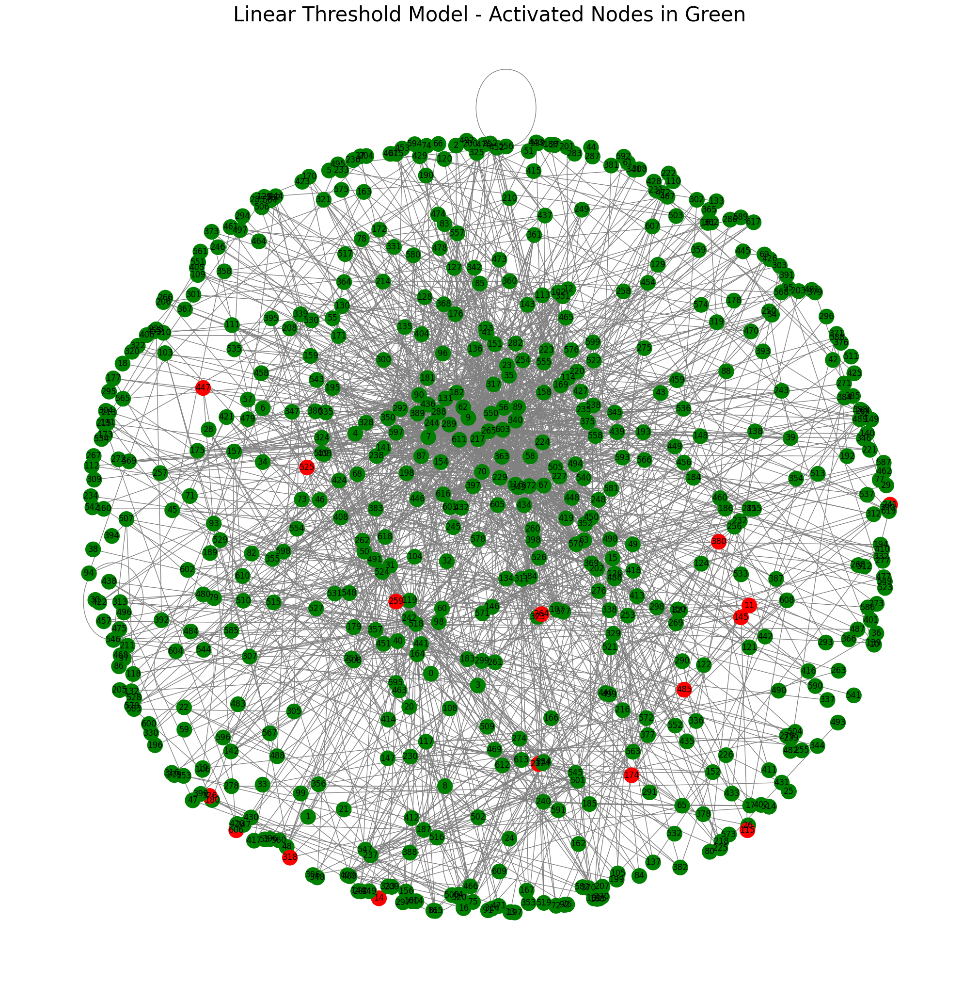

In [27]:
def linear_threshold_model(G, seeds, thresholds, iterations=100):
    activated = set(seeds)  # Track activated nodes
    new_activated = set(seeds)  # Nodes activated in the current round

    for it in range(iterations):
        next_activated = set()  # Track newly activated nodes in this iteration
        
        for node in G.nodes():
            if node not in activated:
                active_neighbors = [n for n in G.neighbors(node) if n in activated]
                total_influence = len(active_neighbors) / len(list(G.neighbors(node))) if G.degree(node) > 0 else 0
                
                if total_influence >= thresholds[node]:
                    next_activated.add(node)
        print('Iteration: ', it, ' Size of next activated: ', len(next_activated))

        if not next_activated:
            break  # No more nodes can be activated
        
        activated.update(next_activated)  # Update activated nodes

    return activated

# Assign thresholds
#thresholds = np.zeros(G.number_of_nodes())

# Set initial seeds
seeds = [0, 1]

# Run the linear threshold model
activated_nodes = linear_threshold_model(G, seeds, thresholds)

# Visualize the network with activated nodes
plt.figure(figsize=(20, 20))

nx.draw(G, pos, with_labels=True, node_color=['green' if node in activated_nodes else 'red' for node in G.nodes()],
        node_size=500, edge_color='gray')
plt.title("Linear Threshold Model - Activated Nodes in Green", fontsize=30)
plt.show()
